In [217]:
import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Activation
from keras.datasets import mnist
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
import scipy.integrate
from matplotlib import cm

In [218]:
# Set the axes labels font size
plt.rc('axes', labelsize=16)
# Set the font size for x tick labels
plt.rc('xtick', labelsize=12)
# Set the font size for y tick labels
plt.rc('ytick', labelsize=12)
# Set the legend font size
plt.rc('legend', fontsize=14)
# Set the legend font size
plt.rcParams.update({'font.size': 12})


## 1) Initialisers

In [219]:
class LowRankWeightInitialiser(tf.keras.initializers.Initializer):
  def __init__(self, rank, stddev_alpha, width_previous, columns):
    self.rank = rank
    self.stddev_alpha = stddev_alpha
    self.width_previous = width_previous
    self.columns = columns

  def __call__(self, shape, dtype=None, **kwargs):
    ## let's generate the weights matrix based on the orthonormal columns
    coeffs = tf.random.normal((self.rank,self.width_previous), stddev=self.stddev_alpha)
    weights = self.columns @ coeffs
    return tf.reshape(weights, shape)
    
  def get_config(self):  # To support serialization
    return {"rank":self.rank, "stddev_alpha": self.stddev_alpha,
            "width_previous":self.width_previous}

class LowRankBiasInitialiser(tf.keras.initializers.Initializer):
  def __init__(self, rank, stddev_b, width_previous, columns):
    self.rank = rank
    self.stddev_b = stddev_b
    self.width_previous = width_previous
    self.columns = columns

  def __call__(self, shape, dtype=None, **kwargs):
    ## let's generate orthonormal vectors
    bias = tf.random.normal(shape=(self.rank,),stddev=self.stddev_b)
    biases = self.columns*bias
    total_bias = tf.math.reduce_sum(biases, axis=1)
    return tf.reshape(total_bias, shape)
    
  def get_config(self):  # To support serialization
    return {"rank":self.rank, 
            "stddev_b": self.stddev_b, 
            "width_previous":self.width_previous}

# 2) Histogram of pre and post activation values

In [249]:
# Get and normalize a sample batch of mnist data to work with

(x_train, y_train), (x_test, y_test)= mnist.load_data()
batch_size = 256
x = x_train[:batch_size, :, :]/255
y = y_train[:batch_size]/255

#function to  build feed a fordward net
def get_model(ranks, widths=[28**2], sigma_alpha = 1, sigma_b = 0,
              normalize = True, activation='tanh'):
  model = Sequential([Flatten()])
  if len(ranks) != len(widths):
    raise Exception('The length of the widths does not match the length of the ranks.')

  if (ranks>widths).any():
    raise Exception('The rank at any layer needs to be greater than the width.')

  for i, N in enumerate(widths[1:]):
    rank = int(ranks[i])
    X = (1/np.sqrt(widths[i])) * tf.random.normal((widths[i],widths[i])) ## generate columns of variance 1/N_l
    Q, _ = tf.linalg.qr(X)
    columns = Q[:,:rank]
    if normalize:  
      kernel_initialiser = LowRankWeightInitialiser(rank=rank, stddev_alpha=sigma_alpha/np.sqrt(widths[i-1]), 
                                              width_previous=widths[i-1], columns=columns)
    else:
      kernel_initialiser = LowRankWeightInitialiser(rank=rank, stddev_alpha=sigma_alpha/np.sqrt(widths[i-1]), 
                                              width_previous=widths[i-1], columns=columns)
      
    bias_initialiser = LowRankBiasInitialiser(rank=rank, stddev_b = sigma_b,
                                              width_previous=widths[i-1], columns=columns)
    #print(type(kernel_initialiser))
    model.add(Dense(N, kernel_initializer=kernel_initialiser, use_bias=True, bias_initializer=bias_initialiser))
    model.add(Activation(activation))
  print('mean', np.mean(columns))

  print('var', np.var(columns))
  print('la somme des lignes est',np.sum(columns[:,0]**2))
  print('la somme des colonnes est', np.sum(columns[0]**2))

  return model

In [250]:
#Experiment with these parameters

widths = [28**2] + [28**2 for _ in range(6)] # [input dim] + [layer_wdths]
normalize = True
gamma = 1/4
ranks = gamma * np.array(widths)
sigma_alpha = 1
sigma_b = 0
activation='tanh'
get_model(ranks=ranks,widths=widths, normalize=normalize, sigma_alpha=sigma_alpha, sigma_b=sigma_b, activation=activation)

mean -0.00014671189
var 0.0012754886
la somme des lignes est 1.0000005
la somme des colonnes est 0.24235398


In [222]:
def get_activations(x, ranks, widths, sigma_alpha, sigma_b, normalize, activation):
  # build new instance of model (i.e. new weights and biases)
  model = get_model(ranks=ranks, widths=widths, normalize=normalize, sigma_alpha=sigma_alpha, sigma_b=sigma_b, activation=activation)
  model.build((None, 28,28))
  # build function to collect pre-activation layers when an input is passed into the net
  inp = model.input
  out = [layer.output for layer in model.layers if isinstance(layer, Dense)]
  get_lay_outputs = K.function(inp, out)

  # Pass input  through the net to get layer outputs 
  pre_activation_layers = get_lay_outputs(x)

  # build function to collect post-activation layers when an input is passed into the net
  inp = model.input
  out = [layer.output for layer in model.layers if isinstance(layer, Activation)]
  get_lay_outputs = K.function(inp, out)
  
  # Pass input  through the net to get layer outputs
  post_activation_layers = get_lay_outputs(x)
  
  #avoid memory problems by deleting model and clearing session
  del model
  tf.keras.backend.clear_session()
  return pre_activation_layers, post_activation_layers


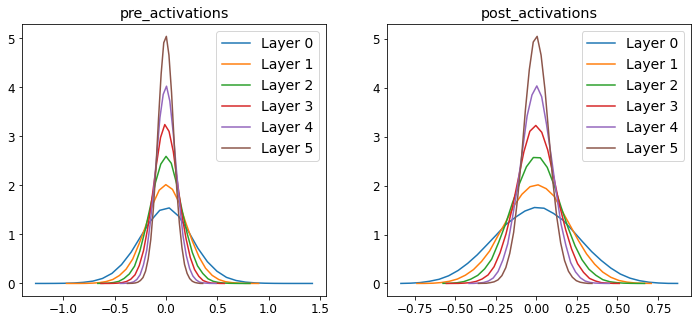

In [223]:
pre_activation_layers, post_activation_layers = get_activations(x,ranks,widths,sigma_alpha, sigma_b, normalize, activation)

fig, axs = plt.subplots(1,2, figsize=(12,5))
for i, activations in enumerate(pre_activation_layers):
  h, b = np.histogram(activations, bins=30, density=True)
  b = [(b[i+1]+b[i])/2 for i in range(len(b)-1) ]
  axs[0].plot(b,h, label = f"Layer {i}")
axs[0].set_title("pre_activations")
axs[0].legend()

for i, activations in enumerate(post_activation_layers):
  h, b = np.histogram(activations, bins=30, density=True)
  b = [(b[i+1]+b[i])/2 for i in range(len(b)-1) ]
  axs[1].plot(b,h, label = f"Layer {i}")
axs[1].set_title("post_activations")
axs[1].legend()

##3a) Calculating q*

First, lets calculate $q^*$ by iteratively solving for $q^l$, using equation (3) from the paper by Poole et al.:
\begin{align*}
q^l = \sigma_w^2 \int \phi(\sqrt{q^{l-1}}z) \frac{1}{\sqrt{2\pi}} \exp^{-z^2} dz + \sigma_b^2
\end{align*}

In [224]:
def normal(z):
  return (1/np.sqrt(2*np.pi))*np.exp(-(z**2)/2)

def integrand(z,q):
  return normal(z)*(np.tanh(np.sqrt(q)*z)**2)

[1.04625088 1.85816398 0.94666119 0.73954586 0.66487492 0.63344314
 0.61933559 0.61281967 0.60977013 0.60833405 0.60765582 0.60733506
 0.60718327 0.60711141]


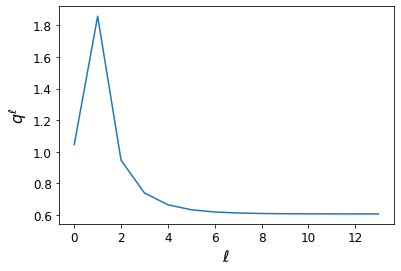

In [229]:
N = 1000 #layer width
gamma = 1/4
x = np.random.normal(size=N)

#use initial condition given in the paper
q0 = (1/len(x))*np.dot(x,x)
sigma_w_original = 1.3
sigma_b_original= 0.3
sigma_alpha = sigma_w_original * np.sqrt(gamma**(-1))
sigma_b = sigma_b_original * np.sqrt(gamma**(-1))
q1 = gamma * (sigma_alpha**2)*q0 + gamma * sigma_b**2 

qs = []
qs.append(q0)
qs.append(q1)


#iterate to convergence within specified tolerance
count = 0
while np.abs(qs[count+1]-qs[count])>1e-04:
  q1,_ = sp.integrate.quad(lambda z: integrand(z,q1), -np.inf, np.inf)
  q1 = gamma *(sigma_alpha**2)*q1 + gamma * sigma_b**2
  qs.append(q1)
  count+=1

# Display and plot the results
plt.plot(qs)
plt.xlabel('$\ell$')
plt.ylabel('$q^{\ell}$')
print(np.array(qs))


## 3b) Empirically observed q*

Next, lets design a feedforward networks, and calculate the length of each layer, averaged of the weights and biases



In [230]:
#function to  build feed fordward tanh net
def get_model(num_layers, ranks, width, sigma_alpha = 2, sigma_b = 0.3):  
  model = Sequential([Flatten()])
  if len(ranks) != num_layers:
    raise Exception('The length of the widths does not match the length of the ranks.')

  if (ranks>width).any():
    raise Exception('The rank at any layer needs to be greater than the width.')

  for i in range(num_layers):
    rank = int(ranks[i])
    ## r column vectors that are orthonormal
    X = (1/np.sqrt(width)) * tf.random.normal((width,width)) ## generate columns of variance 1/N_l
    Q, _ = tf.linalg.qr(X)
    columns = Q[:,:rank]

    kernel_initialiser = LowRankWeightInitialiser(rank, sigma_alpha/np.sqrt(width), width, columns)
    bias_initialiser = LowRankBiasInitialiser(rank, sigma_b, width, columns)

    a = Dense(width, kernel_initializer=kernel_initialiser, use_bias=True, bias_initializer=bias_initialiser)
    model.add(a)
    model.add(Activation('tanh'))

  return model

In [234]:
#N = 1000 #layer width
x = np.random.normal(size=(1,N)) ## 1 input data
num_layers = 7
gamma = 1/4
ranks = np.array(num_layers*[gamma*N])

average_layer_norms = np.zeros(num_layers)
# build new instance of model (i.e. new weights and biases)
model = get_model(num_layers, ranks, N,sigma_alpha=sigma_alpha,sigma_b=sigma_b)
model.build((None, N))

# build function to collect pre-activation layers when an input is passed into the net
inp = model.input
out = [layer.output for layer in model.layers if isinstance(layer, Dense)]
get_lay_outputs = K.function(inp, out)

# Pass input through the net to get layer outputs 
pre_activation_layers = get_lay_outputs(x)
#print(np.shape(pre_activation_layers))

# calculate squared 2-norm of each pre-activation layer
for l, lay in enumerate(pre_activation_layers):
  h = lay[0,:]
  average_layer_norms[l]+=(np.linalg.norm(h,2)**2)/N

#avoid memory problems by deleting model and clearing session
del model
tf.keras.backend.clear_session()

average_layer_norms

array([1.82408798, 0.91594802, 0.74055242, 0.70123745, 0.73965723,
       0.60535128, 0.64290676])

## 3c) Computing the edge of chaos curve

Here,  we simply use what you proved in questiton 3, to calculate $\sigma_w$ from $q^*$, and the equation (3) - used above - to calculate $\sigma_b$ from $\sigma_w$ and $q^*$, enforcing $\chi=1$. Let us fix $q^* \in (0,∞)$,

\begin{align*}
\chi = \gamma \sigma_{\alpha}^2 \int \phi^{\prime}(\sqrt{q^*}z)^2 \frac{1}{\sqrt{2\pi}} e^{-\frac{z^2}{2}} dz \implies \sigma_{\alpha}^2 = \frac{1}{\gamma} \frac{1}{\int \phi^{\prime}(\sqrt{q^*}z)^2 \frac{1}{\sqrt{2\pi}} e^{-\frac{z^2}{2}}dz}\\
q^* = \gamma \sigma_{\alpha}^2 \int \phi(\sqrt{q^*}z)^2 \frac{1}{\sqrt{2\pi}} e^{-\frac{z^2}{2}}dz + \gamma \sigma^2_b \implies \sigma_b^2 = \frac{1}{\gamma} q^* - \sigma_{\alpha}^2 \int \phi(\sqrt{q^*}z)^2 \frac{1}{\sqrt{2\pi}} e^{-\frac{z^2}{2}}dz
\end{align*}




In [ ]:
def d_tanh(z):
  return np.subtract(1, np.square(np.tanh(z)))

def chi_1_integrand(z, qstar):
  return normal(z)*(d_tanh(np.sqrt(qstar)*z))**2
  
def calc_s_alpha(qstar, gamma):
  integral, _ = sp.integrate.quad(lambda z: chi_1_integrand(z,qstar), -np.inf, np.inf)
  return np.sqrt( (1/gamma) * np.divide(1,integral))

def calc_sb(qstar, s_alpha, gamma):
  integral,_ = sp.integrate.quad(lambda z: integrand(z,qstar), -np.inf, np.inf)
  return np.sqrt( (1/gamma) * qstar - (s_alpha**2)*integral)

In [ ]:
sigma_alphas = []
sigma_bs = []
list_gamma = np.array([1/4,1])
for gamma in list_gamma:
  sigma_alpha = []
  sigma_b = []
  for qstar in np.linspace(0.1, 1.5, 300):
    salpha = calc_s_alpha(qstar, gamma)
    sb = calc_sb(qstar, salpha, gamma)
    sigma_alpha.append(salpha)
    sigma_b.append(sb)
  sigma_alphas.append(np.array(sigma_alpha))
  sigma_bs.append(np.array(sigma_b))

In [ ]:
x = sigma_alphas[-1]**2
y = sigma_bs[-1]**2
(ax1, ax2) = plt.subplots(figsize=(10,10),sharex=True, sharey=True,dpi=1200)
ax2.fill_between(x, y, facecolor='pink',alpha=0.3)
ax2.fill_between(x, y, plt.ylim()[1], facecolor='skyblue',alpha=0.3)
plt.scatter(x, y, c=np.linspace(0.1, 1.5, 300),cmap=cm.gist_heat)
plt.colorbar()

xtextplace = x[45]
ytextplace = y[200] 
plt.text(xtextplace,ytextplace,"Ordered" "\n" r"$\chi(\sigma_{w},\sigma_b}$) < 1",fontsize=20)
xtextplace = x[160]
ytextplace = y[100] 
plt.text(xtextplace,ytextplace,"Chaotic" "\n" r"$\chi(\sigma_{w},\sigma_b}$) > 1",fontsize=20)
plt.xlabel(r'$\sigma^2_{w}$')
plt.ylabel(r'$\sigma^2_{b}$')
plt.margins(x=0)
plt.margins(y=0)

plt.savefig('EOC_gamma1.pdf')

In [ ]:
x = list_gamma[0] * sigma_ws[0]**2
y = list_gamma[0] * sigma_bs[0]**2
(ax1, ax2) = plt.subplots(figsize=(10,10),sharex=True, sharey=True,dpi=1200)
ax2.fill_between(x, y, facecolor='pink',alpha=0.3)
ax2.fill_between(x, y, plt.ylim()[1], facecolor='skyblue',alpha=0.3)
plt.scatter(x, y, c=np.linspace(0.1, 1.5, 300),cmap=cm.gist_heat)
plt.colorbar()

xtextplace = x[45]
ytextplace = y[200] 
plt.text(xtextplace,ytextplace,"Ordered" "\n" r"$\chi_{\gamma}(\sigma_{\alpha},\sigma_b}$) < 1",fontsize=20)
xtextplace = x[160]
ytextplace = y[100] 
plt.text(xtextplace,ytextplace,"Chaotic" "\n" r"$\chi_{\gamma}(\sigma_{\alpha},\sigma_b}$) > 1",fontsize=20)
plt.xlabel(r'$\gamma \sigma^2_{\alpha}$')
plt.ylabel(r'$\gamma \sigma^2_{b}$')
plt.margins(x=0)
plt.margins(y=0)

plt.savefig('EOC_gamma14.pdf')


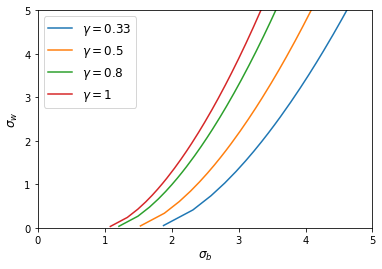

In [ ]:
l = np.linspace(0, 10, 100)
list_gammas = np.linspace(0.0001, 1, 10)
colours = cm.RdGy(np.linspace(0, 0.35, 10))
plt.figure(figsize=(8,8), dpi=1200)


#recreating the plot of the edge of chaos from Figure 2c in the Poole et al. paper
for i in range(len(list_gamma)):
  plt.plot(sigma_ws[i], sigma_bs[i])
#plt.plot(sigma_bs[0], sigma_bs[0], label="Identity")
plt.xlim([0,5])
plt.ylim([0,5])
plt.xlabel('$\sigma_b$')
plt.ylabel('$\sigma_w$')
plt.legend()
#plt.title(r'The Edge of Chaos curve given by $\chi_1 = 1$')
plt.show()

##4)  Correlation with depth

In this question, we will pass 2 inputs through our feedforward net, and check their correlations $c_{12}$ at each  layer. Vary the values of $\sigma_w$ and $\sigma_b$ and see what happens. Note that one type of behaviour is easier to see when starting with correlated inputs, and the other is more easily visible when starting with uncorrelated inputs - hence the different initialisations of $x_2$

vary these $\sigma_w$; for $\sigma_w =1.3$ for $\sigma_b =0.3$ is in the ORDERED regime, $\sigma_w=2.5$ and larger is in the CHAOTIC regime for $\sigma_b=0.3$.

In the ordered regime our correlation coefficient converges to 1, since because $c^*=1$ is a stable fixed point $(\chi_1<1)$

In the CHAOTIC regime, our correlation coefficient converges to some other fixed point which is now stable: $\bar{c}\in[0,1)$. The fixed point $c^*=1$ is unstable because $\chi_1>1$ (see Fig 2-A in paper). 

This means that the points decorelate, at least to some extent. For $\sigma_b=0$, the convergence is towards $\bar{c}=0$, so the points perfectly decorrelate at infinity (the angle between them becomes 90 degrees in the limit). For any $\sigma_b>0$ we get transient chaos. 


In [ ]:
#function to  build feed fordward tanh net
def get_model(num_layers, ranks, width, sigma_alpha = 2, sigma_b = 0.3):  
  model = Sequential([Flatten()])
  if len(ranks) != num_layers:
    raise Exception('The length of the widths does not match the length of the ranks.')

  if (ranks>width).any():
    raise Exception('The rank at any layer needs to be greater than the width.')

  for i in range(num_layers):
    rank = int(ranks[i])
    ## r column vectors that are orthonormal
    X = (1/np.sqrt(width)) * tf.random.normal((width,width)) ## generate columns of variance 1/N_l
    Q, _ = tf.linalg.qr(X)
    columns = Q[:,:rank]

    kernel_initialiser = LowRankWeightInitialiser(rank, sigma_alpha/np.sqrt(width), width, columns)
    bias_initialiser = LowRankBiasInitialiser(rank, sigma_b, width, columns)

    a = Dense(width, kernel_initializer=kernel_initialiser, use_bias=True, bias_initializer=bias_initialiser)
    model.add(a)
    model.add(Activation('tanh'))

  return model

### 4a) Empirical computation of $c^*$

We will enfore a starting correlation between inputs $x = (x_1, \dots, x_N), y = (y_1, \dots, y_N) \in \mathbb{R}^N$ of $c^0$ by generating it from a 2d multivariate gaussian whose covariance matrix has value $c^*$ as off diagonal coefficients and $1$ on the diagonal.

In [ ]:
N = 1000
gamma = 1/4

c0 = 0.8
matrix_cov = np.array([[1, c0],[c0,1]])
nb_simul = 10
num_layers = 31
ranks = np.array(num_layers*[gamma*N])
average_correlation_1, average_correlation_2, average_correlation_3 = np.zeros((nb_simul, num_layers)), np.zeros((nb_simul, num_layers)), np.zeros((nb_simul, num_layers))


for i in range(nb_simul):
  data = np.random.multivariate_normal(mean=np.zeros(2), cov=matrix_cov,size=(N))
  x1,x2_sim = data[:,0], data[:,1]
  x1, x2_sim = x1.reshape((1,N)), x2_sim.reshape((1,N))

  #vary these
  sigma_w1 = 1.3
  sigma_w2 = 2.5
  sigma_w3 = 4
  sigma_alpha1 = np.sqrt(gamma**(-1)) * sigma_w1
  sigma_alpha2 = np.sqrt(gamma**(-1)) * sigma_w2
  sigma_alpha3 = np.sqrt(gamma**(-1)) * sigma_w3

  sigma_b = 0.3
  sigma_b = np.sqrt(gamma**(-1)) * sigma_b

  average_layer_corrs1 = np.zeros(num_layers)
  average_layer_corrs2 = np.zeros(num_layers)
  average_layer_corrs3 = np.zeros(num_layers)

  model1 = get_model(num_layers, ranks, sigma_alpha = sigma_alpha1, sigma_b = sigma_b,width=N)
  model1.build((None, N))
  model2 = get_model(num_layers, ranks, sigma_alpha = sigma_alpha2, sigma_b = sigma_b,width=N)
  model2.build((None, N))
  model3 = get_model(num_layers, ranks, sigma_alpha = sigma_alpha3, sigma_b = sigma_b,width=N)
  model3.build((None, N))

  inp1 = model1.input
  out1 = [layer.output for layer in model1.layers if isinstance(layer, Dense)]
  get_lay_outputs1 = K.function(inp1, out1)
  pre_activation_layers11 = get_lay_outputs1(x1)
  pre_activation_layers12 = get_lay_outputs1(x2_sim)

  for l in range(len(pre_activation_layers11)):
    h11 = pre_activation_layers11[l][0,:]
    h12 = pre_activation_layers12[l][0,:]
    average_layer_corrs1[l]+= np.corrcoef(h11, h12)[0,1]

  inp2 = model2.input
  out2 = [layer.output for layer in model2.layers if isinstance(layer, Dense)]
  get_lay_outputs2 = K.function(inp2, out2)
  pre_activation_layers21 = get_lay_outputs2(x1)
  pre_activation_layers22 = get_lay_outputs2(x2_sim)


  for l in range(len(pre_activation_layers21)):
    h21 = pre_activation_layers21[l][0,:]
    h22 = pre_activation_layers22[l][0,:]
    average_layer_corrs2[l]+= np.corrcoef(h21, h22)[0,1]

  inp3 = model3.input
  out3 = [layer.output for layer in model3.layers if isinstance(layer, Dense)]
  get_lay_outputs3 = K.function(inp3, out3)
  pre_activation_layers31 = get_lay_outputs3(x1)
  pre_activation_layers32 = get_lay_outputs3(x2_sim)


  for l in range(len(pre_activation_layers31)):
    h31 = pre_activation_layers31[l][0,:]
    h32 = pre_activation_layers32[l][0,:]
    average_layer_corrs3[l]+= np.corrcoef(h31, h32)[0,1]
  
  average_correlation_1[i] = average_layer_corrs1
  average_correlation_2[i] = average_layer_corrs2
  average_correlation_3[i] = average_layer_corrs3

  del model1, model2, model3
  tf.keras.backend.clear_session()



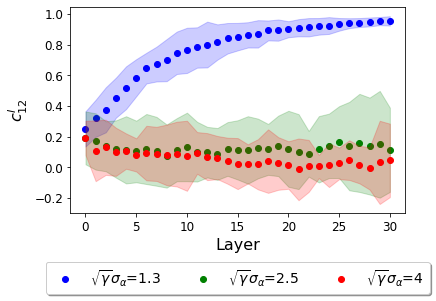

In [ ]:
ax = plt.subplot(111)

plt.scatter(np.arange(num_layers), np.mean(average_correlation_1,axis=0), label=r'$\sqrt{\gamma} \sigma_{\alpha}$=1.3',color="blue")
plt.fill_between(np.arange(num_layers), np.mean(average_correlation_1,axis=0) - 2*np.std(average_correlation_1,axis=0), 
                 np.mean(average_correlation_1,axis=0) + 2*np.std(average_correlation_1,axis=0), color='blue', alpha=0.2 )
plt.scatter(np.arange(num_layers), np.mean(average_correlation_2,axis=0), label=r'$\sqrt{\gamma} \sigma_{\alpha}$=2.5',color="green")
plt.fill_between(np.arange(num_layers), np.mean(average_correlation_2,axis=0) - 2*np.std(average_correlation_2,axis=0), 
                 np.mean(average_correlation_2,axis=0) + 2*np.std(average_correlation_2,axis=0), color='green', alpha=0.2)
plt.scatter(np.arange(num_layers), np.mean(average_correlation_3,axis=0), label=r'$\sqrt{\gamma} \sigma_{\alpha}$=4',color="red")
plt.fill_between(np.arange(num_layers), np.mean(average_correlation_3,axis=0) - 2*np.std(average_correlation_3,axis=0), 
                 np.mean(average_correlation_3,axis=0) + 2*np.std(average_correlation_3,axis=0), color='red', alpha=0.2)
plt.xlabel('Layer')
plt.ylabel('$c_{12}^l$')

# Shrink current axis's height by 10% on the bottom
box = ax.get_position()
ax.set_position([box.x0, box.y0 + box.height * 0.05,
                 box.width, box.height * 0.95])

# Put a legend below current axis
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2),
          fancybox=True, shadow=True, ncol=3)
plt.show()

## 4b) Theoretical computation of $c^*$

In [ ]:
def normal(z):
  return (1/np.sqrt(2*np.pi))*np.exp(-(z**2)/2)

def integrand(z,q):
  return normal(z)*(np.tanh(np.sqrt(q)*z)**2)

def integrand_corr(z1,z2,q_star,c):
  u1 = np.sqrt(q_star) * z1
  u2 = np.sqrt(q_star) * (c * z1 + np.sqrt(1-c**2)* z2)
  return normal(z1) * normal(z2) * np.tanh(u1) * np.tanh(u2)


In [ ]:
def compute_qstar(original_sigma_w, original_sigma_b, gamma, width,x=None):
  if x is None:
    x = np.random.normal(size=width)
  else:
    x = x.reshape((width))

  #use initial condition given in the paper 
  q0 = (1/len(x))*np.dot(x,x)
  sigma_alpha = original_sigma_w * np.sqrt(gamma**(-1))
  sigma_b = original_sigma_b * np.sqrt(gamma**(-1))
  q1 = gamma * (sigma_alpha**2)*q0 + gamma * sigma_b**2 

  qs = []
  qs.append(q0)
  qs.append(q1)
  print(np.shape(qs))

  #iterate to convergence within specified tolerance
  count = 0
  while np.abs(qs[count+1]-qs[count])>1e-04:
    q1,_ = sp.integrate.quad(lambda z: integrand(z,q1), -np.inf, np.inf)
    q1 = gamma * (sigma_alpha**2)*q1 + gamma * sigma_b**2
    qs.append(q1)
    count+=1

  q_star = qs[-1]
  return q_star

In [ ]:
N = 1000 #layer width
gamma = 1/4
sigma_b_original = 0.3
list_sequences_c = []
for sigma_w in [1.3, 2.5, 4.0]: ## using the variances used in Poole et al 2016
  sigma_alpha = sigma_w * np.sqrt(gamma**(-1))
  sigma_b = sigma_b_original * np.sqrt(gamma**(-1))

  ## We first compute q_star 
  q_star = compute_qstar(sigma_w, sigma_b_original, gamma, N)
  #use random initial condition 
  c = c0

  cs = []
  cs.append(c)

  #iterate to convergence within specified tolerance
  count = 0

  while count<30:
    c, _ = sp.integrate.dblquad(integrand_corr, -np.inf, np.inf, -np.inf, np.inf, args=(q_star,c,))
    c = gamma *(sigma_alpha**2)*c + gamma * sigma_b**2
    c = c/q_star
    cs.append(c)
    count+=1
  list_sequences_c.append(np.array(cs))


In [ ]:
plt.figure(figsize=(10,10), dpi=1200)
ax = plt.subplot(111)

plt.plot(np.arange(31), list_sequences_c[0], label=r'$\sqrt{\gamma} \sigma_{\alpha}$=1.3', color="blue", linewidth=3)
plt.plot(np.arange(31), list_sequences_c[1], label=r'$\sqrt{\gamma} \sigma_{\alpha}$=2.5', color="green", linewidth=3)
plt.plot(np.arange(31), list_sequences_c[2], label=r'$\sqrt{\gamma} \sigma_{\alpha}$=4', color="red", linewidth=3)
plt.scatter(np.arange(num_layers), average_layer_corrs1, color="blue",alpha=0.4)
plt.scatter(np.arange(num_layers), average_layer_corrs2, color="green",alpha=0.4)
plt.scatter(np.arange(num_layers), average_layer_corrs3, color="red",alpha=0.4)
plt.fill_between(np.arange(num_layers), np.mean(average_correlation_1,axis=0) - 2*np.std(average_correlation_1,axis=0), 
                 np.mean(average_correlation_1,axis=0) + 2*np.std(average_correlation_1,axis=0), color='blue', alpha=0.2 )
plt.fill_between(np.arange(num_layers), np.mean(average_correlation_2,axis=0) - 2*np.std(average_correlation_2,axis=0), 
                 np.mean(average_correlation_2,axis=0) + 2*np.std(average_correlation_2,axis=0), color='green', alpha=0.2)
plt.fill_between(np.arange(num_layers), np.mean(average_correlation_3,axis=0) - 2*np.std(average_correlation_3,axis=0), 
                 np.mean(average_correlation_3,axis=0) + 2*np.std(average_correlation_3,axis=0), color='red', alpha=0.2)
plt.ylim(0,1)
plt.xlabel(r'layer ($l$)')
plt.ylabel(r'correlation ($c_{12}^l$)')

# Shrink current axis's height by 10% on the bottom
box = ax.get_position()
ax.set_position([box.x0, box.y0 + box.height * 0.2,
                 box.width, box.height * 0.8])

# Put a legend below current axis
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1),
          fancybox=True, shadow=True, ncol=3)
plt.savefig('dynamics_correlation_C0_08_gamma_14.pdf')


Let us plot the iterative correlation map

In [ ]:
N = 1000 #layer width
gamma = 1/4
sigma_b_original = 0.3
mappings = []
for sigma_w in [1.3, 2.5, 4.0]: ## using the variances used in Poole et al 2016
  sigma_alpha = sigma_w * np.sqrt(gamma**(-1))
  sigma_b = sigma_b_original * np.sqrt(gamma**(-1))

  ## We first compute q_star 
  q_star = compute_qstar(sigma_w, sigma_b_original, gamma, N)
  #use random initial condition 
  grid_c = np.linspace(0,1,100)
  maps = np.zeros(100)

  for i in range(len(grid_c)) :
    c = grid_c[i]
    integ, _ = sp.integrate.dblquad(integrand_corr, -np.inf, np.inf, -np.inf, np.inf, args=(q_star,c,))

    maps[i] = 1/q_star * (gamma *(sigma_alpha**2)*integ + gamma * sigma_b**2)

  mappings.append(maps)


In [ ]:
plt.figure(figsize=(10,10), dpi=1200)
ax = plt.subplot(111)

plt.plot(grid_c, mappings[0], color='blue', label=r'$\sqrt{\gamma} \sigma_{\alpha}$=1.3',linewidth=5.0)
plt.plot(grid_c, mappings[1], color='green', label=r'$\sqrt{\gamma} \sigma_{\alpha}$=2.5', linewidth=5.0)
plt.plot(grid_c, mappings[2], color='red', label=r'$\sqrt{\gamma} \sigma_{\alpha}$=4.0', linewidth=5.0)
plt.plot(grid_c, grid_c, linestyle="--", color="black")
plt.xlabel(r'input correlation ($c^{l-1}_{12}$)')
plt.ylabel(r'input correlation ($c^{l}_{12}$)')
plt.xlim(0,1)
plt.ylim(0,1)
plt.scatter(1,1,marker='*', s=800,color='blue',zorder=30, clip_on=False)
plt.scatter(0.13,0.13,marker='*', s=800,color='green',zorder=30, clip_on=False)
plt.scatter(0.03,0.03,marker='*', s=800,color='red',zorder=30, clip_on=False)


# Shrink current axis's height by 10% on the bottom
box = ax.get_position()
ax.set_position([box.x0, box.y0 + box.height * 0.2,
                 box.width, box.height * 0.8])

# Put a legend below current axis
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1),
          fancybox=True, shadow=True, ncol=3)
plt.savefig('correlation_map_sb_03_tanh_thicklines.pdf')

## 5) Correlation depth scale

\begin{align*}
\xi^{-1}_{c, \gamma} = - \log(\chi_{\gamma}) = - \log\bigg(\gamma \sigma^2_{\alpha} \int Dz (\phi^\prime(\sqrt{q^*}z))^2 \bigg)
\end{align*}

In [ ]:
def d_tanh(z):
  return np.subtract(1, np.square(np.tanh(z)))

def chi_1_integrand(z, qstar):
  return normal(z)*(d_tanh(np.sqrt(qstar)*z))**2

### 5a) Theoretical computation

In [ ]:
gamma = 1/4
width = 1000

original_sigma_square_b = np.linspace(0.01, 0.3, 6)
original_sigma_square_w = np.linspace(0, 3, 100)
xi = np.zeros((len(original_sigma_square_b), len(original_sigma_square_w)))

for i in range(len(original_sigma_square_b)):
  sigma_b_s_original = original_sigma_square_b[i]
  for j in range(len(original_sigma_square_w)):
    sigma_w_s_original = original_sigma_square_w[j]
    q_star = compute_qstar(np.sqrt(sigma_w_s_original),np.sqrt(sigma_b_s_original), gamma, width)
    integral,_ = sp.integrate.quad(chi_1_integrand, -np.inf, np.inf, args=(q_star,))
    xi[i,j] = (- np.log(sigma_w_s_original * integral))**(-1)


<ipython-input-22-0e087d83558d>:14: RuntimeWarning: divide by zero encountered in log
  xi[i,j] = (- np.log(sigma_w_s_original * integral))**(-1)


Text(0.5, 0, '$\\gamma \\sigma^2_{\\alpha}$')

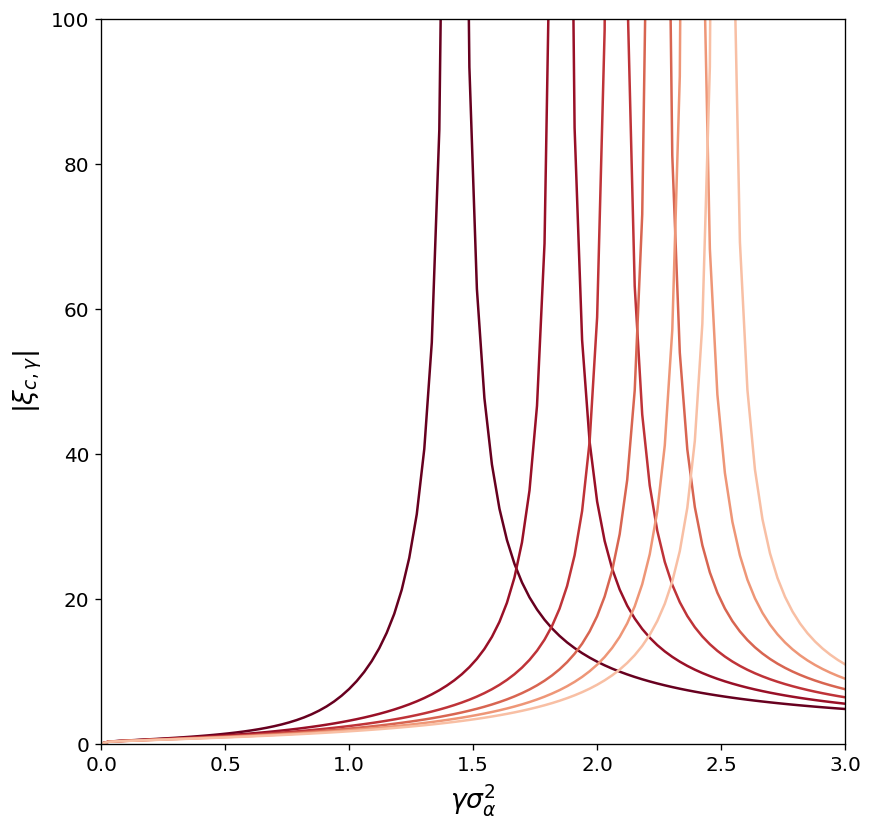

In [ ]:
## constant proportionality coefficient along layers
colours = cm.RdGy(np.linspace(0, 0.35, 6))
plt.figure(figsize=(8,8),dpi=120)

for i in range(len(original_sigma_square_b)):
  plt.plot(original_sigma_square_w,np.abs(xi[i]), color=colours[i])

plt.ylim(0,100)
plt.xlim(0,3)
plt.ylabel(r'$|\xi_{c,\gamma}|$')
plt.xlabel(r'$\gamma \sigma^2_{\alpha}$')


### 5b) Empirical correlation depth scale

In [ ]:
x = np.random.normal(size=(1,width)) ## 1 input data

num_layers = 7
gamma = 1/4
ranks = np.array(num_layers*[gamma*width])

original_sigma_square_w_emp3 = np.linspace(1,3,50)

xi_empirical3 = np.zeros((len(original_sigma_square_b), len(original_sigma_square_w_emp3)))

for i in range(len(original_sigma_square_b)):
  sigma_b_s_original = original_sigma_square_b[i]
  for j in range(len(original_sigma_square_w_emp3)):
    sigma_w_s_original = original_sigma_square_w_emp3[j]

    # build new instance of model (i.e. new weights and biases)
    sigma_alpha = gamma**(-1/2) * np.sqrt(sigma_w_s_original)
    sigma_b = gamma**(-1/2) * np.sqrt(sigma_b_s_original)

    model = get_model(num_layers, ranks, sigma_alpha=sigma_alpha, sigma_b= sigma_b, width=width)
    model.build((None, width))

    # build function to collect pre-activation layers when an input is passed into the net
    inp = model.input
    out = [layer.output for layer in model.layers if isinstance(layer, Dense)]
    get_lay_outputs = K.function(inp, out)

    # Pass input through the net to get layer outputs 
    pre_activation_layers = get_lay_outputs(x)

    ## we take the last preactivation layer so that eventually the preactivations will have converged to a gaussian with variance q_star
    discrete_integral = np.mean(d_tanh(pre_activation_layers[-1])**2)
    xi_empirical3[i,j] = (- np.log(gamma * sigma_alpha**2 * discrete_integral))**(-1)

    #avoid memory problems by deleting model and clearing session
    del model
    tf.keras.backend.clear_session()


In [ ]:
## constant proportionality coefficient along layers
colours = cm.RdGy(np.linspace(0, 1, 6))
plt.figure(figsize=(8,8),dpi=1200)

for i in range(len(original_sigma_square_b)):
  plt.plot(original_sigma_square_w,np.abs(xi[i]), color=colours[i])
  plt.scatter(original_sigma_square_w, np.abs(xi_empirical[i]), color=colours[i])
  plt.scatter(original_sigma_square_w_emp, np.abs(xi_empirical2[i]), color=colours[i])
  plt.scatter(original_sigma_square_w_emp3, np.abs(xi_empirical3[i]), color=colours[i])


plt.ylim(0,100)
plt.xlim(0,3)
plt.ylabel(r'$|\xi_{c,\gamma}|$')
plt.xlabel(r'$\gamma \sigma^2_{\alpha}$')
plt.savefig('corr_depth_scale_sbs_001to03_tanh_redblackcmap.pdf')

##6) Gradient magnitude through depth

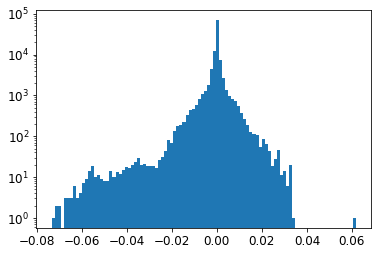

In [ ]:
# For this question we will need a loss function, and so we will need data with labels. We may as well use MNIST - though synthetic data would do just fine.

 # Sample batch of MNIST data
(x_train, y_train), (x_test, y_test)= mnist.load_data()
batch_size = 128
x_batch = x_train[:batch_size, :, :]
y_batch = y_train[:batch_size]
input_dim = int((np.shape(x_batch)[1])*(np.shape(x_batch)[2]))

loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)

# functions to compute loss and gradients

def loss(model, x, y, training):
  y_hat = model(x)
  return loss_object(y_true=y, y_pred=y_hat)

def grad(model, inputs, targets):
  with tf.GradientTape() as tape:
    loss_value = loss(model, inputs, targets, training=True)
  return loss_value, tape.gradient(loss_value, model.trainable_variables)

# Function to build model

def get_model(ranks, widths, sigma_alpha=2.5, sigma_b=0.3):  
  model = Sequential()
  model.add(Flatten())

  for i in range(1,len(widths)-1):
    rank = int(ranks[i])
    X = (1/np.sqrt(widths[i])) * tf.random.normal((widths[i],widths[i])) ## (N_l, N_l)
    Q, _ = tf.linalg.qr(X)
    columns = Q[:,:rank]

    kernel_initialiser = LowRankWeightInitialiser(rank, sigma_alpha/np.sqrt(widths[i-1]), widths[i-1], columns)
    bias_initialiser = LowRankBiasInitialiser(rank, sigma_b, widths[i-1], columns)
    model.add(Dense(widths[i], kernel_initializer=kernel_initialiser, use_bias=True, 
                    bias_initializer=bias_initialiser))
    model.add(Activation('tanh'))

  # last layer with 10 ouputs to get a 10-class classification task 
  X = (1/np.sqrt(widths[-1])) * tf.random.normal((widths[-1],widths[-1]))
  Q, _ = tf.linalg.qr(X)
  columns = Q[:,:int(ranks[-1])]
  kernel_initialiser = LowRankWeightInitialiser(int(ranks[-1]), sigma_alpha/np.sqrt(widths[-2]), widths[-2], columns)
  bias_initialiser = LowRankBiasInitialiser(int(ranks[-1]), sigma_b, widths[-2], columns)
  model.add(Dense(widths[-1], kernel_initializer=kernel_initialiser, use_bias=True, bias_initializer=bias_initialiser))
  return model

# Now we build a deep net, and vary 𝜎_alpha and 𝜎_b and examine the impact on the gradients

num_layers = 4
#vary these
gamma = 1/4
sigma_alpha = 1
sigma_b = 0.3
N = 100

layers_widths = np.array([input_dim] + num_layers*[N] + [10]) # [input dim] + [layer_widths] + last layer with 10 classes
layers_ranks = gamma * layers_widths


low_rank_model = get_model(layers_ranks, layers_widths, sigma_alpha=sigma_alpha, sigma_b=sigma_b)
loss_value,  grads = grad(low_rank_model, x_batch, y_batch)
plt.hist(np.concatenate([tf.reshape(g, -1) for g in grads]), bins = 100, log=True);
 

In [ ]:
## the first gradient is wrt the first weight matrix, the second is wrt the first bias vector, etc.
for i in range(len(grads)):
  print('grads['+str(i)+']: '+ str(np.shape(grads[i])))
  

grads[0]: (784, 100)
grads[1]: (100,)
grads[2]: (100, 100)
grads[3]: (100,)
grads[4]: (100, 100)
grads[5]: (100,)
grads[6]: (100, 100)
grads[7]: (100,)
grads[8]: (100, 10)
grads[9]: (10,)


In [ ]:
width = 300
num_layers = 250
gamma = 1/4

batch_size = 1
x_batch = x_train[:batch_size, :, :]
y_batch = y_train[:batch_size]
input_dim = int((np.shape(x_batch)[1])*(np.shape(x_batch)[2]))

layers_widths = np.array([input_dim] + num_layers*[N] + [10]) # [input dim] + [layer_widths] + last layer with 10 classes
layers_ranks = gamma * layers_widths

original_sigma_square_w = np.linspace(1, 4, 30)
original_sigma_square_b = np.array([0.05])

norms_along_layers = np.zeros((len(original_sigma_square_b), len(original_sigma_square_w), num_layers-1))

norm_grad_empirical = np.zeros((len(original_sigma_square_b), len(original_sigma_square_w)))

for i in range(len(original_sigma_square_b)):
  sigma_b_s_original = original_sigma_square_b[i]
  for j in range(len(original_sigma_square_w)):
    sigma_w_s_original = original_sigma_square_w[j]

    # build new instance of model (i.e. new weights and biases)
    sigma_alpha = gamma**(-1/2) * np.sqrt(sigma_w_s_original)
    sigma_b = gamma**(-1/2) * np.sqrt(sigma_b_s_original)

    low_rank_model = get_model(layers_ranks, layers_widths, sigma_alpha=sigma_alpha, sigma_b=sigma_b)
    loss_value,  grads = grad(low_rank_model, x_batch, y_batch)
    
    count=0
    for k in range(2,2*num_layers-1,2):
      norms_along_layers[i,j,count] = np.sum(grads[k]**2)
      count+=1

    #avg_grads_weights = np.mean(grads[num_layers:2*num_layers-1:2])
    ## we take the last preactivation layer so that eventually the preactivations will have converged to a gaussian with variance q_star
    norm_grad_empirical[i,j] = np.sum(grads[-4]**2)

    #avoid memory problems by deleting model and clearing session
    del low_rank_model
    tf.keras.backend.clear_session()

In [ ]:
def compute_qstar(original_sigma_w, original_sigma_b, gamma, width,x=None):
  if x is None:
    x = np.random.normal(size=width)

  #use initial condition given in the paper 
  q0 = (1/len(x))*np.dot(x,x)
  sigma_alpha = original_sigma_w * np.sqrt(gamma**(-1))
  sigma_b = original_sigma_b * np.sqrt(gamma**(-1))
  q1 = gamma * (sigma_alpha**2)*q0 + gamma * sigma_b**2 

  qs = []
  qs.append(q0)
  qs.append(q1)

  #iterate to convergence within specified tolerance
  count = 0
  while np.abs(qs[count+1]-qs[count])>1e-04:
    q1,_ = sp.integrate.quad(lambda z: integrand(z,q1), -np.inf, np.inf)
    q1 = gamma * (sigma_alpha**2)*q1 + gamma * sigma_b**2
    qs.append(q1)
    count+=1

  q_star = qs[-1]
  return q_star

In [ ]:
## computation of \chi_{\gamma}

chi = np.zeros((len(original_sigma_square_b), len(original_sigma_square_w)))

for i in range(len(original_sigma_square_b)):
  sigma_b_s_original = original_sigma_square_b[i]
  for j in range(len(original_sigma_square_w)):
    sigma_w_s_original = original_sigma_square_w[j]
    q_star = compute_qstar(np.sqrt(sigma_w_s_original),np.sqrt(sigma_b_s_original), gamma, width, x=np.ravel(x_batch))
    integral,_ = sp.integrate.quad(chi_1_integrand, -np.inf, np.inf, args=(q_star,))
    chi[i,j] = sigma_w_s_original * integral


In [ ]:
colours = cm.copper(np.linspace(0, 1, len(original_sigma_square_w)))
plt.figure(figsize=(8,8),dpi=1200)
l = np.arange(num_layers-1)

for i in range(0,len(original_sigma_square_w),5):
  plt.scatter(np.arange(num_layers-1),norms_along_layers[0,i],color=colours[i],s=1)
  plt.plot(np.arange(num_layers-1),np.exp((num_layers -l)*np.log(chi[0,i])),color=colours[i],alpha=0.2)


plt.yscale('log')
plt.ylabel(r'$||\nabla_{\alpha^l} E||_2^2$')
plt.xlabel('layer ($l$)')
plt.ylim(bottom=1e-29,top=1e22)
plt.xlim(0,250)
plt.savefig('gradient_exp_propagation_with_theory_sbs_005_sbw_0to4_width300_tanh.pdf')

<ipython-input-197-dbf5c7577e28>:7: RuntimeWarning: divide by zero encountered in log
  plt.plot(np.arange(num_layers-1),np.exp((num_layers -l)*np.log(chi[0,i])),color=colours[i],alpha=0.2)


# 7) Variance of the spectrum of the Jacobian 

Recall that 
\begin{align*}
\sigma^2_{JJ^T} & = L(\frac{\mu_2}{\mu_1^2} - 1 - s_1) \\
\text{where}\\
s_1 & = \begin{cases} 1 - \frac{1}{\gamma} \text{ when the weights are scaled orthogonal,} \\
-\frac{1}{\gamma} \text{ when the weights are scaled gaussian.}
\end{cases}
\end{align*}

In [17]:
class LowRankWeightOrthogonalInitialiser(tf.keras.initializers.Initializer):
  def __init__(self, rank, stddev_alpha, width, width_previous):
    self.rank = rank
    self.stddev_alpha = stddev_alpha
    self.width = width
    self.width_previous = width_previous

  def __call__(self, shape, dtype=None, **kwargs):
    ## let's generate the weights matrix based on orthonormal columns
    a = (1/np.sqrt(width)) * tf.random.normal((self.width,self.width), dtype=dtype)
    # Compute the qr factorization
    q, r = tf.linalg.qr(a)
    q_modified = q@ np.diag(np.sign(np.diag(r))) ## to get a uniform distribution on the manifold of orthogonal matrices
    weights = np.zeros((self.width, self.width_previous))
    weights[:,:self.rank] = self.stddev_alpha * q_modified[:,:self.rank]
    return tf.convert_to_tensor(weights,dtype=dtype)
    
  def get_config(self):  # To support serialization
    return {"rank":self.rank, "stddev_alpha": self.stddev_alpha,
            "width":self.width,
            "width_previous":self.width_previous}


In [18]:
class LowRankWeightInitialiser(tf.keras.initializers.Initializer):
  def __init__(self, rank, stddev_alpha, width_previous, columns):
    self.rank = rank
    self.stddev_alpha = stddev_alpha
    self.width_previous = width_previous
    self.columns = columns

  def __call__(self, shape, dtype=None, **kwargs):
    ## let's generate the weights matrix based on the orthonormal columns
    coeffs = tf.random.normal((self.rank,self.width_previous), stddev=self.stddev_alpha)
    weights = self.columns @ coeffs
    return tf.reshape(weights, shape)
    
  def get_config(self):  # To support serialization
    return {"rank":self.rank, "stddev_alpha": self.stddev_alpha,
            "width_previous":self.width_previous}

class LowRankBiasInitialiser(tf.keras.initializers.Initializer):
  def __init__(self, rank, stddev_b, width_previous, columns):
    self.rank = rank
    self.stddev_b = stddev_b
    self.width_previous = width_previous
    self.columns = columns

  def __call__(self, shape, dtype=None, **kwargs):
    ## let's generate orthonormal vectors
    bias = tf.random.normal(shape=(self.rank,),stddev=self.stddev_b)
    biases = self.columns*bias
    total_bias = tf.math.reduce_sum(biases, axis=1)
    return tf.reshape(total_bias, shape)
    
  def get_config(self):  # To support serialization
    return {"rank":self.rank, 
            "stddev_b": self.stddev_b, 
            "width_previous":self.width_previous}

### From here, we define all the needed functions for a specific activation: tanh.

\begin{align*}
\phi(x) = \text{tanh}(x) := \frac{\text{sinh}(x)}{\text{cosh}(x)} = \frac{\exp(x) - \exp(-x)}{\exp(x) + \exp(-x)}
\end{align*}

In [19]:
def d_tanh(z):
  return np.subtract(1, np.square(np.tanh(z)))

def normal(z):
  return (1/np.sqrt(2*np.pi))*np.exp(-(z**2)/2)

def integrand(z,q):
  return normal(z)*(np.tanh(np.sqrt(q)*z)**2)

def chi_1_integrand(z, qstar):
  return normal(z)*(d_tanh(np.sqrt(qstar)*z))**2

def integrand_corr(z1,z2,q_star,c):
  u1 = np.sqrt(q_star) * z1
  u2 = np.sqrt(q_star) * (c * z1 + np.sqrt(1-c**2)* z2)
  return normal(z1) * normal(z2) * np.tanh(u1) * np.tanh(u2)
  
def calc_s_alpha(qstar, gamma):
  integral, _ = sp.integrate.quad(lambda z: chi_1_integrand(z,qstar), -np.inf, np.inf)
  return  (1/gamma) * np.divide(1,integral)

def calc_sb(qstar, s_alpha, gamma):
  integral,_ = sp.integrate.quad(lambda z: integrand(z,qstar), -np.inf, np.inf)
  return  (1/gamma) * qstar - s_alpha*integral

def mu_k(z,q_star,k):
  return normal(z) * (d_tanh(np.sqrt(q_star) * z))**(2*k)

### From here, we define all the needed functions for a specific activation: linear.

\begin{align*}
\phi(x) = x
\end{align*}

In [20]:
from keras import backend as K
from keras.utils.generic_utils import get_custom_objects

def linear(x):
  return x

get_custom_objects().update({'linear': Activation(linear)})

## DEFINING EVERYTHING AGAIN WITH ERF FUNCTION

def normal(z):
  return (1/np.sqrt(2*np.pi))*np.exp(-(z**2)/2)

def d_linear(z):
  return tf.ones(z.shape)

def integrand_linear(z,q):
  return normal(z)*(linear(np.sqrt(q)*z))**2

def chi_1_integrand_linear(z, qstar):
  return normal(z)

def integrand_corr_linear(z1,z2,q_star,c):
  u1 = np.sqrt(q_star) * z1
  u2 = np.sqrt(q_star) * (c * z1 + np.sqrt(1-c**2)* z2)
  return normal(z1) * normal(z2) * linear(u1) * linear(u2)
  
def calc_s_alpha_linear(qstar, gamma):
  #integral,_ = sp.integrate.quad(integrand_linear, -np.inf, np.inf, args=(qstar,))
  integral = 1
  return  (1/gamma) 

def calc_sb_linear(qstar, s_alpha, gamma):
  #integral,_ = sp.integrate.quad(integrand_linear, -np.inf, np.inf, args=(qstar,))
  return  (1/gamma - s_alpha) * qstar 

def mu_k_linear(z,q_star,k):
  return normal(z) 

### From here, we define everything in the case of the ERF activation function.

\begin{align*}
\phi(x) = \text{erf} (\frac{\sqrt{\pi}}{2} x)
\end{align*}


In [21]:
from scipy import special

def erf(x):
  return tf.math.erf(1/2 * np.sqrt(np.pi) * x)

get_custom_objects().update({'erf': Activation(erf)})

## DEFINING EVERYTHING AGAIN WITH ERF FUNCTION

def normal(z):
  return (1/np.sqrt(2*np.pi))*np.exp(-(z**2)/2)

def d_erf(z):
  return np.exp(-1/4 * np.pi * z**2)

def integrand_erf(z,q):
  return normal(z)*(erf(np.sqrt(q)*z))**2

def chi_1_integrand_erf(z, qstar):
  return normal(z)*(d_erf(np.sqrt(qstar)*z))**2

def integrand_corr_erf(z1,z2,q_star,c):
  u1 = np.sqrt(q_star) * z1
  u2 = np.sqrt(q_star) * (c * z1 + np.sqrt(1-c**2)* z2)
  return normal(z1) * normal(z2) * erf(u1) * erf(u2)
  
def calc_s_alpha_erf(qstar, gamma):
  integral, _ = sp.integrate.quad(chi_1_integrand_erf, -np.inf, np.inf, args=(qstar,))
  return  (1/gamma) * np.divide(1,integral)

def calc_sb_erf(qstar, s_alpha, gamma):
  integral,_ = sp.integrate.quad(integrand_erf, -np.inf, np.inf, args=(qstar,))
  return  (1/gamma) * qstar - (s_alpha)*integral

def mu_k_erf(z,q_star,k):
  return normal(z) * (d_erf(np.sqrt(q_star) * z))**(2*k)

## Now let us build our model 

In [150]:
def sigma_theoretical_jacobian(L, q_star, gamma, activation="tanh",sampling="gaussian"):
  if sampling =="gaussian":
    s_1 = -1/gamma
  else:
    s_1 = 1 - 1/gamma
  
  if activation=='erf':
    mu1,_ = sp.integrate.quad(mu_k_erf, -np.inf, np.inf,args=(q_star,1,))
    mu2,_ = sp.integrate.quad(mu_k_erf, -np.inf, np.inf,args=(q_star,2,))
  elif activation=="linear":
    mu1,_ = sp.integrate.quad(mu_k_linear, -np.inf, np.inf,args=(q_star,1,))
    mu2,_ = sp.integrate.quad(mu_k_linear, -np.inf, np.inf,args=(q_star,2,))
  elif activation=='tanh':
    mu1,_ = sp.integrate.quad(mu_k, -np.inf, np.inf,args=(q_star,1,))
    mu2,_ = sp.integrate.quad(mu_k, -np.inf, np.inf,args=(q_star,2,))
  
  sigma_square_JJT = L *  (mu2/(mu1**2) - 1 - s_1)
  return sigma_square_JJT, mu1, mu2


In [151]:
#function to  build feed fordward tanh/erf net with constant width 
def get_model(num_layers, ranks, width, sigma_alpha, sigma_b,activation='tanh',sampling='gaussian'):  
  model = Sequential()

  for i in range(num_layers):
    rank = int(ranks[i])
    ## r column vectors that are orthonormal
    X = (1/np.sqrt(width)) * tf.random.normal((width,width)) ## generate columns of variance 1/N_l
    Q, _ = tf.linalg.qr(X)
    columns = Q[:,:rank]

    if sampling=='orthogonal':
      kernel_initialiser = LowRankWeightOrthogonalInitialiser2(rank, sigma_alpha, width, width)

    else:
      kernel_initialiser = LowRankWeightInitialiser(rank, sigma_alpha/np.sqrt(width), width, columns)
    
    bias_initialiser = LowRankBiasInitialiser(rank, sigma_b, width, columns)
    #bias_initialiser = tf.random_normal_initializer(mean=0.0, stddev=sigma_b) ## no influence on the jacobian 

    a = Dense(width, kernel_initializer=kernel_initialiser, use_bias=True, bias_initializer=bias_initialiser)
    model.add(a)
    model.add(Activation(activation))

  return model

In [210]:
class LowRankWeightOrthogonalInitialiser(tf.keras.initializers.Initializer):
  def __init__(self, rank, stddev_alpha, width, width_previous):
    self.rank = rank
    self.stddev_alpha = stddev_alpha
    self.width = width
    self.width_previous = width_previous

  def __call__(self, shape, dtype=None, **kwargs):
    ## let's generate the weights matrix based on orthonormal columns
    a = (1/np.sqrt(self.width)) * tf.random.normal((self.width,self.width), dtype=dtype)
    # Compute the qr factorization
    q, r = tf.linalg.qr(a)
    q_modified = q@ np.diag(np.sign(np.diag(r))) ## to get a uniform distribution on the manifold of orthogonal matrices
    weights = np.zeros((self.width, self.width_previous))
    weights[:,:self.rank] = self.stddev_alpha * q_modified[:,:self.rank]
    return tf.convert_to_tensor(weights,dtype=dtype)
    
  def get_config(self):  # To support serialization
    return {"rank":self.rank, "stddev_alpha": self.stddev_alpha,
            "width":self.width,
            "width_previous":self.width_previous}


In [211]:
class LowRankWeightOrthogonalInitialiser2(tf.keras.initializers.Initializer):
  def __init__(self, rank, stddev_alpha, width, width_previous):
    self.rank = rank
    self.stddev_alpha = stddev_alpha
    self.width = width
    self.width_previous = width_previous

  def __call__(self, shape, dtype=None, **kwargs):
    a = (1/np.sqrt(self.width)) * tf.random.normal((self.width,self.width))
    # Compute the qr factorization
    q, r = tf.linalg.qr(a)
    q_modified = q@ np.diag(np.sign(np.diag(r))) ## to get a uniform distribution on the manifold of orthogonal matrices
    A = np.zeros((self.width, self.rank))
    A[:,:self.rank] = q_modified[:,:self.rank]
    weights = self.stddev_alpha * A @ A.T
    return tf.convert_to_tensor(weights,dtype=dtype)
    
  def get_config(self):  # To support serialization
    return {"rank":self.rank, "stddev_alpha": self.stddev_alpha,
            "width":self.width,
            "width_previous":self.width_previous}


In [215]:
def empirical_jacobian(num_layers, sigma_alpha, sigma_b, gamma, width, x, activation='tanh', sampling="gaussian", seed=0):
  np.random.seed(seed)
  tf.random.set_seed(seed)

  ranks = np.array(num_layers*[gamma*width])

  # build new instance of model (i.e. new weights and biases)
  model = get_model(num_layers, ranks, width, sigma_alpha=sigma_alpha, sigma_b=sigma_b,activation=activation,sampling=sampling)
  model.build((None, width))

  # build function to collect pre-activation layers when an input is passed into the net
  inp = model.input
  out = [layer.output for layer in model.layers if isinstance(layer, Dense)]
  get_lay_outputs = K.function(inp, out)

  # Pass input through the net to get layer outputs 
  pre_activation_layers = get_lay_outputs(x)

  W = np.zeros((num_layers, width, width))
  D = np.zeros((num_layers, width, width))
  J = np.eye(width, width)
  norm_preactivation = np.zeros(num_layers)

  # calculate squared 2-norm of each pre-activation layer
  for l, lay in enumerate(pre_activation_layers):
    h = lay[0,:]
    W[l] = model.get_weights()[2*l]
    if activation=="erf":
      D[l] = np.diag(d_erf(h))
    elif activation=="linear":
      D[l] = np.diag(d_linear(h))
    elif activation=='tanh':
      D[l] = np.diag(d_tanh(h))
    J = (D[l]@W[l]) @ J

    ## let us see how q evolves and check if it stays near q^*
    norm_preactivation[l] = np.mean(h**2)

  if activation=="erf":
  ## we take the last preactivation layer so that eventually the preactivations will have converged to a gaussian with variance q_star
    discrete_mu1 = np.mean(d_erf(pre_activation_layers[-1])**2)
  elif activation=="linear":
    discrete_mu1 = np.mean(d_linear(pre_activation_layers[-1])**2)
  elif activation=='tanh':
    discrete_mu1 = np.mean(d_tanh(pre_activation_layers[-1])**2)

  #avoid memory problems by deleting model and clearing session
  del model
  tf.keras.backend.clear_session()
  
  return J, discrete_mu1, norm_preactivation

### Testing

In [ ]:
seed = 17
sampling="orthogonal"
activation="erf"

gamma = 1
num_layers = 16
width = 1000
q_star = 0.5


## We need to ensure we are right on the Edge of chaos, to do so, we fix q_star and we get sigma_alpha, then sigma_b
if activation=='erf':
  sigma_alpha_square = calc_s_alpha_erf(q_star, gamma)
  sigma_b_square = calc_sb_erf(q_star, sigma_alpha_square, gamma)
elif activation=='linear':
  sigma_alpha_square = calc_s_alpha_linear(q_star, gamma)
  sigma_b_square = calc_sb_linear(q_star, sigma_alpha_square, gamma) 
elif activation=='tanh':
  sigma_alpha_square = calc_s_alpha(q_star, gamma)
  sigma_b_square = calc_sb(q_star, sigma_alpha_square, gamma)   


sigma_alpha, sigma_b =  np.sqrt(sigma_alpha_square), np.sqrt(sigma_b_square)
print(r'$\sigma_{\alpha}, \sigma_b )$ = (', sigma_alpha, sigma_b,')')

np.random.seed(seed)
## we choose an input such that q^1 = q^* following Poole et al formula 
q_0 = (1/(gamma*sigma_alpha_square) ) * (q_star - sigma_b_square)

x = np.random.normal(size=(1,width))
input = np.sqrt(width * q_0) * x/(np.linalg.norm(x, ord=2))

J_empirical, discrete_mu1, norm_q = empirical_jacobian(num_layers, sigma_alpha, sigma_b, gamma, width, input, activation=activation, sampling=sampling, seed=seed)

In [ ]:
empirical_evals = np.linalg.eigh(J_empirical @ J_empirical.T)[0]
sigma_square_theory, mu1, mu2 = sigma_theoretical_jacobian(num_layers, q_star, gamma, activation=activation,sampling=sampling)
print(r"Check we re on the EOC, $\chi$ = ", mu1 * gamma * sigma_alpha**2)
print('The theoretical variance of the spectrum is ', sigma_square_theory)
print('The empirical mean of the spectrum is ', np.mean(empirical_evals))
print('The empirical variance of the spectrum is ', np.var(empirical_evals))

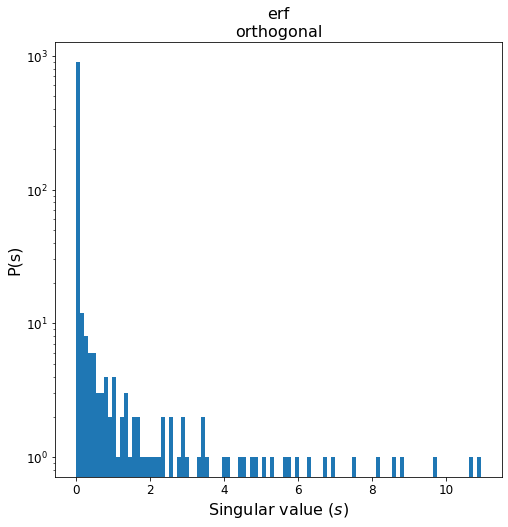

In [140]:
plt.figure(figsize=(8,8))
plt.title(activation +'\n' + sampling, fontsize=16)
plt.ticklabel_format(useOffset=False)
plt.hist(np.sqrt(abs(empirical_evals)),bins=100)
plt.yscale('log')
plt.xlabel(r'Singular value $(s)$')
plt.ylabel('P(s)')
plt.show()

### Generating the plots

In [168]:
depths = [2, 8, 16, 32, 128]
list_gammas = np.linspace(0.1, 1, 10)


NB_simul = 3

sampling="orthogonal"
activation="erf"

width = 1000
q_star = 0.5
sigmasJJT_square_emp = np.zeros((len(depths), len(list_gammas), NB_simul)) 
sigmasJJT_square_theo = np.zeros((len(depths), len(list_gammas))) 


for i in range(len(depths)):
  L = depths[i]
  print('********************** ', L, ' **********************')
  for j in range(len(list_gammas)):
    gamma = list_gammas[j]
    for k in range(NB_simul):
      seed = 3*k 
      np.random.seed(seed)
      ## setting
      ## We need to ensure we are right on the Edge of chaos, to do so, we fix q_star and we get sigma_alpha, then sigma_b
      if activation=='erf':
        sigma_alpha_square = calc_s_alpha_erf(q_star, gamma)
        sigma_b_square = calc_sb_erf(q_star, sigma_alpha_square, gamma)
      elif activation=='linear':
        sigma_alpha_square = calc_s_alpha_linear(q_star, gamma)
        sigma_b_square = calc_sb_linear(q_star, sigma_alpha_square, gamma) 
      elif activation=='tanh':
        sigma_alpha_square = calc_s_alpha(q_star, gamma)
        sigma_b_square = calc_sb(q_star, sigma_alpha_square, gamma)   


      sigma_alpha, sigma_b =  np.sqrt(sigma_alpha_square), np.sqrt(sigma_b_square)

      ## we choose an input such that q^1 = q^* following Poole et al formula 
      q_0 = (1/(gamma*sigma_alpha_square) ) * (q_star - sigma_b_square)

      x = np.random.normal(size=(1,width))
      input = np.sqrt(width * q_0) * x/(np.linalg.norm(x, ord=2))


      J_empirical, discrete_mu1, norm_q = empirical_jacobian(L, sigma_alpha, sigma_b, gamma, width, input, activation=activation, sampling=sampling, seed=seed)

      empirical_evals = np.linalg.eigh(J_empirical @ J_empirical.T)[0]
      sigma_square_empirical = np.var(empirical_evals)

      sigmasJJT_square_emp[i,j,k] = sigma_square_empirical

    sigma_square_theory, mu1, mu2 = sigma_theoretical_jacobian(L, q_star, gamma, activation=activation,sampling=sampling)
    sigmasJJT_square_theo[i,j] = sigma_square_theory



**********************  2  **********************
**********************  8  **********************
**********************  16  **********************
**********************  32  **********************
**********************  128  **********************


In [169]:
np.save("sigma_square_emp_orthogonal_erf.npy", sigmasJJT_square_emp)
np.save("sigma_square_theo_orthogonal_erf.npy", sigmasJJT_square_theo)
np.save("list_gammas_orthogonal_erf.npy", list_gammas)


#### generation of the entire spectrum

In [ ]:
depths = [2, 16, 128]
list_gammas = [1/4, 1/2, 1]

sampling="gaussian"
activation="erf"

width = 1000
q_star = 0.5
sigmasJJT_square_emp = np.zeros((len(list_gammas), len(depths))) 
sigmasJJT_square_theo = np.zeros((len(list_gammas), len(depths))) 
empirical_eigenvalues = np.zeros((len(list_gammas), len(depths), width))


for i in range(len(list_gammas)):
  gamma = list_gammas[i]
  print('********************** ', gamma, ' **********************')
  for j in range(len(depths)):
    L = depths[j]
    print('')
    print(L)
    seed = 3*j
    np.random.seed(seed)
    ## setting
    ## We need to ensure we are right on the Edge of chaos, to do so, we fix q_star and we get sigma_alpha, then sigma_b
    if activation=='erf':
      sigma_alpha_square = calc_s_alpha_erf(q_star, gamma)
      sigma_b_square = calc_sb_erf(q_star, sigma_alpha_square, gamma)
    elif activation=='linear':
      sigma_alpha_square = calc_s_alpha_linear(q_star, gamma)
      sigma_b_square = calc_sb_linear(q_star, sigma_alpha_square, gamma) 
    elif activation=='tanh':
      sigma_alpha_square = calc_s_alpha(q_star, gamma)
      sigma_b_square = calc_sb(q_star, sigma_alpha_square, gamma)   

    sigma_alpha, sigma_b =  np.sqrt(sigma_alpha_square), np.sqrt(sigma_b_square)
    ## we choose an input such that q^1 = q^* following Poole et al formula 
    q_0 = (1/(gamma*sigma_alpha_square) ) * (q_star - sigma_b_square)
    x = np.random.normal(size=(1,width))
    input = np.sqrt(width * q_0) * x/(np.linalg.norm(x, ord=2))

    J_empirical, discrete_mu1, norm_q = empirical_jacobian(L, sigma_alpha, sigma_b, gamma, width, input, activation=activation, sampling=sampling, seed=seed)
    empirical_evals = np.linalg.eigh(J_empirical @ J_empirical.T)[0]

    empirical_eigenvalues[i,j] = empirical_evals
    sigma_square_empirical = np.var(empirical_evals)

    sigmasJJT_square_emp[i,j] = sigma_square_empirical
    sigma_square_theory, mu1, mu2 = sigma_theoretical_jacobian(L, q_star, gamma, activation=activation,sampling=sampling)

    sigma_square_theory, mu1, mu2 = sigma_theoretical_jacobian(L, q_star, gamma, activation=activation,sampling=sampling)
    sigmasJJT_square_theo[i,j] = sigma_square_theory

In [ ]:
colours = cm.copper(np.linspace(0, 1, len(depths)))
# Share a Y axis with each row of subplots
fig, axs = plt.subplots(1, 3, sharey='row',figsize=(25,10),dpi=1200) 
axs[0].set_ylabel(r'$P(s)$')

for i in range(len(list_gammas)):
  for j in range(len(depths)-1, -1, -1):
    axs[i].hist(np.sqrt(abs(empirical_eigenvalues[i][j])), color=colours[j],label='L = '+str(depths[j])
    , bins=100,alpha=0.9, zorder=10 * j)
    axs[i].set_xlim(0,50)
    #axs[i].set_xlim(left=0)
    axs[i].set_xlabel(r'$s$')
    axs[i].legend()


axs[0].set_title(r'$\gamma=\frac{1}{4}$', fontsize=18)
axs[1].set_title(r'$\gamma=\frac{1}{2}$',fontsize=18)
axs[2].set_title(r'$\gamma=1$',fontsize=18)


plt.yscale('log')
plt.ylim(top=10)
plt.legend()
plt.savefig('final_spectrum_bars_gaussian_erf.pdf')